In [ ]:
import gdown
import tensorflow as tf
import keras
from keras.models import Sequential
from keras import layers
from keras import applications
from keras import optimizers
from keras.applications import EfficientNetB0
from keras.models import Model
from keras.metrics import Precision, Recall
from keras.callbacks import TensorBoard
from keras.utils import load_img, img_to_array
from keras.metrics import CategoricalAccuracy, TopKCategoricalAccuracy
from keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, Input
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import pandas as pd

## Conseguir y preparar dataset

In [ ]:
# Dataset
poke_id = '1BQOodOsnStcMwdF1xIA41_i7tNNvRbYK'
poke_url = f'https://drive.google.com/uc?id={poke_id}'
gdown.download(poke_url, 'pokemondataset.zip', quiet = True)

'pokemondataset.zip'

In [ ]:
# Demonstration
demo_id = '1z64RIglmjkudp-71QdOGWUbsqeVtb2N6'
demo_url = f'https://drive.google.com/uc?id={demo_id}'
gdown.download(demo_url, 'demonstration.zip', quiet = True)

'demonstration.zip'

In [ ]:
!unzip 'pokemondataset.zip'
!rm -rf 'pokemondataset.zip'
!unzip 'demonstration.zip'
!rm -rf 'demonstration.zip'

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: pokemondataset/Vaporeon/vaporeon_1_png.rf.651fcbecb16fd2beb97c5e3188d8f335.jpg  
  inflating: pokemondataset/Vaporeon/vaporeon_1_png.rf.b45ab81cce32587429d78894eb013f8e.jpg  
  inflating: pokemondataset/Vaporeon/vaporeon_1_png.rf.b4bb3e694b2416e7ee7a77acdf3ede86.jpg  
  inflating: pokemondataset/Vaporeon/vaporeon_png.rf.b357199e53a70ec7a957e995d010d190.jpg  
   creating: pokemondataset/Venomoth/
  inflating: pokemondataset/Venomoth/00000000_png.rf.0b04f26a22b617f3bd77f365addd5e56.jpg  
  inflating: pokemondataset/Venomoth/00000000_png.rf.6d36c3f5449e25128c44bf7a177f8c6b.jpg  
  inflating: pokemondataset/Venomoth/00000000_png.rf.c0e64e114dc227bea59d8e9dfc024745.jpg  
  inflating: pokemondataset/Venomoth/00000001_png.rf.5910e5636a27b247983e02dc9fc8584a.jpg  
  inflating: pokemondataset/Venomoth/00000001_png.rf.e8573864d6087a154ee9d12fe2d6ba40.jpg  
  inflating: pokemondataset/Venomoth/00000001_png.rf.ed82d0ee

In [ ]:
DATASET_DIRECTORY = 'pokemondataset'
IMAGE_SIZE = (224,224)
BATCH_SIZE = 16
SHUFFLE = True
VALIDATION_SPLIT = 0.2

train_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    subset = 'training',
    validation_split = VALIDATION_SPLIT,
    seed = 123,
    shuffle = SHUFFLE
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    subset = 'validation',
    validation_split = VALIDATION_SPLIT,
    seed = 123,
    shuffle = False
)

Found 45036 files belonging to 151 classes.
Using 36029 files for training.
Found 45036 files belonging to 151 classes.
Using 9007 files for validation.


In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

Found 45036 files belonging to 151 classes.


(16, 224, 224, 3)
(16, 151)


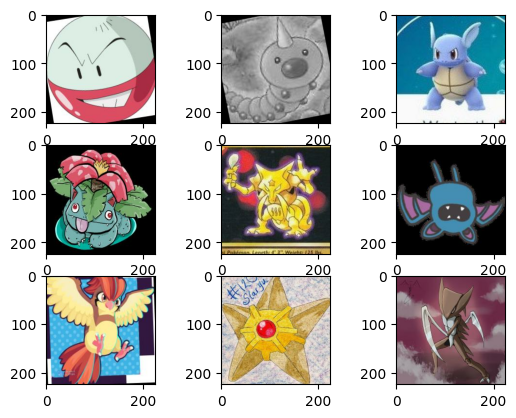

In [ ]:
from numpy import astype
for images, labels in train_ds.take(1):
  print(images.shape)
  print(labels.shape)

  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

# Carga de modelos


In [ ]:
# Modelos
models_id = '1KfSbEenXxITblsUwgHts3MPQK3OhLxIF'
models_url = f'https://drive.google.com/uc?id={models_id}'
gdown.download(models_url, 'models.zip', quiet = True)

'models.zip'

In [ ]:
!unzip 'models.zip'
!rm -rf 'models.zip'

Archive:  models.zip
replace models/pokemon_efficientnetb0.keras? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: models/pokemon_efficientnetb0.keras  
  inflating: models/pokemon_finetuning.keras  
  inflating: models/pokemon_finetuning2.keras  
  inflating: models/pokemon_vgg16.keras  


In [ ]:
model_VGG16 = tf.keras.models.load_model('./models/pokemon_vgg16.keras')

In [ ]:
model_EfficientNetB0 = tf.keras.models.load_model('./models/pokemon_efficientnetb0.keras')

In [ ]:
model_FineTuning = tf.keras.models.load_model('./models/pokemon_finetuning.keras')

In [ ]:
model_FineTuning2 = tf.keras.models.load_model('./models/pokemon_finetuning2.keras')

#VGG16

In [ ]:
import tensorflow as tf
from keras.applications import VGG16

IMG_SHAPE = IMAGE_SIZE + (3,)
inputs = layers.Input(shape=IMG_SHAPE)

# VGG16
base_model = VGG16(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False

# Construcción de la cabeza del modelo
x = base_model(inputs, training=False)

x = GlobalMaxPooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.4)(x)
outputs = layers.Dense(151, activation='softmax')(x)

# Definición del Modelo
model_VGG16 = Model(inputs, outputs, name='Pokemon_VGG16')

model_VGG16.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.Adam(learning_rate=1e-4),
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

model_VGG16.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "Pokemon_VGG16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 512)            │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 151)            │        77,463 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,054,807 (57.43 MB)

 Trainable params: 340,119 (1.30 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
history_VGG16 = model_VGG16.fit(
    train_ds,
    epochs=10,
    validation_data=validation_ds
)

Epoch 1/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 293s 125ms/step - acc: 0.0131 - loss: 25.3487 - top3: 0.0324 - val_acc: 0.0417 - val_loss: 4.8807 - val_top3: 0.1047
Epoch 2/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 267s 119ms/step - acc: 0.0259 - loss: 5.0283 - top3: 0.0526 - val_acc: 0.1009 - val_loss: 4.5798 - val_top3: 0.1721
Epoch 3/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 267s 118ms/step - acc: 0.0510 - loss: 4.8596 - top3: 0.0912 - val_acc: 0.1628 - val_loss: 4.1810 - val_top3: 0.2615
Epoch 4/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 322s 119ms/step - acc: 0.0888 - loss: 4.6086 - top3: 0.1457 - val_acc: 0.2239 - val_loss: 3.7906 - val_top3: 0.3269
Epoch 5/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 267s 118ms/step - acc: 0.1291 - loss: 4.3214 - top3: 0.2077 - val_acc: 0.3257 - val_loss: 3.2143 - val_top3: 0.4493
Epoch 6/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 267s 118ms/step - acc: 0.1779 - loss: 3.9767 - top3: 0.2757 - val_acc: 0.4148 - val_loss: 2.7508 - val_top3: 0.5438
Epoch 7/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 266s 118m

# Metricas VGG16


In [ ]:
# Obtener etiquetas reales (one-hot) y convertir a etiquetas de clase
y_true = np.concatenate([y.numpy() for x, y in test_ds])
y_true_classes = np.argmax(y_true, axis=1)

# Predicciones
y_pred = model_VGG16.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

# Nombres de clases
class_names = test_ds.class_names
# Determinar las clases realmente presentes en los datos
labels_in_data = np.unique(np.concatenate([y_true_classes, y_pred_classes]))
target_names_filtered = [class_names[int(i)] for i in labels_in_data]

# Reporte de clasificación
print(classification_report(y_true_classes, y_pred_classes, labels=labels_in_data, target_names=target_names_filtered, zero_division=0))

2815/2815 ━━━━━━━━━━━━━━━━━━━━ 268s 95ms/step
              precision    recall  f1-score   support

        Abra       0.15      0.03      0.05       176
  Aerodactyl       0.40      0.23      0.29       239
    Alakazam       0.37      0.32      0.34       237
       Arbok       0.58      0.52      0.55       303
    Arcanine       0.51      0.43      0.47       232
    Articuno       0.71      0.62      0.66       252
    Beedrill       0.69      0.50      0.58       222
  Bellsprout       0.61      0.68      0.64       312
   Blastoise       0.53      0.52      0.52       359
   Bulbasaur       0.51      0.57      0.54       366
  Butterfree       0.94      0.88      0.91       309
    Caterpie       0.59      0.59      0.59       299
     Chansey       0.49      0.54      0.51       314
   Charizard       0.37      0.30      0.33       308
  Charmander       0.44      0.38      0.41       336
  Charmeleon       0.37      0.38      0.38       353
    Clefable       0.54      0.54  

In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_true_classes, y_pred_classes, labels=labels_in_data)

cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

errores_por_clase = cm_df.sum(axis=1) - np.diag(cm_df)
top_errores = errores_por_clase.sort_values(ascending=False).head(30)

print("Clases con mayor número de errores:")
print(top_errores)


Clases con mayor número de errores:
Raichu        331
Primeape      301
Flareon       272
Psyduck       271
Goldeen       264
Vaporeon      251
Spearow       248
Snorlax       240
Pidgeot       240
Magikarp      239
Vulpix        238
Farfetchd     238
Nidoking      236
Dragonite     232
Growlithe     229
Rattata       229
Kingler       228
Drowzee       228
Hitmonchan    220
MrMime        220
Rhydon        219
Charmeleon    218
Marowak       217
Mankey        215
Charizard     215
Pidgeotto     215
Kangaskhan    213
Nidoqueen     212
Tauros        210
Charmander    208
dtype: int64


#EfficientNetB0

EfficientNetB0 es una arquitectura más moderna que VGG16, diseñada para ofrecer un mejor equilibrio entre precisión y eficiencia computacional.  
Este modelo optimiza el escalado de profundidad, anchura y resolución, lo que suele traducirse en un mejor desempeño con menos parámetros.


In [ ]:
# Definir la entrada
inputs = Input(shape=IMG_SHAPE)

base_model = EfficientNetB0(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

# Congelar el modelo
base_model.trainable = False

x = base_model(inputs, training=False)
x = GlobalMaxPooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(151, activation='softmax')(x)

model_EfficientNetB0 =  tf.keras.Model(inputs, x, name='EfficientNetB0')

model_EfficientNetB0.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

print(model_EfficientNetB0.summary())

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d_1          │ (None, 1280)           │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 193,431 (755.59 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

None


In [ ]:
history_EfficientNetB0 = model_EfficientNetB0.fit(
    train_ds,
    epochs=10,
    validation_data=validation_ds
)

Epoch 1/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 116s 40ms/step - acc: 0.0572 - loss: 9.0192 - top3: 0.1154 - val_acc: 0.5969 - val_loss: 1.7590 - val_top3: 0.7523
Epoch 2/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 59s 26ms/step - acc: 0.3469 - loss: 3.6970 - top3: 0.5234 - val_acc: 0.7540 - val_loss: 1.0502 - val_top3: 0.8627
Epoch 3/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 60s 26ms/step - acc: 0.5268 - loss: 2.4049 - top3: 0.6951 - val_acc: 0.8210 - val_loss: 0.7699 - val_top3: 0.9064
Epoch 4/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 69s 30ms/step - acc: 0.6212 - loss: 1.8103 - top3: 0.7796 - val_acc: 0.8532 - val_loss: 0.6067 - val_top3: 0.9258
Epoch 5/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 59s 26ms/step - acc: 0.6818 - loss: 1.4693 - top3: 0.8233 - val_acc: 0.8775 - val_loss: 0.5134 - val_top3: 0.9409
Epoch 6/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 59s 26ms/step - acc: 0.7163 - loss: 1.2417 - top3: 0.8515 - val_acc: 0.8994 - val_loss: 0.4105 - val_top3: 0.9561
Epoch 7/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 84s 27ms/step - acc: 

# Metricas EfficientNetB0


In [ ]:
# Obtener etiquetas reales (one-hot) y convertir a etiquetas de clase
y_true = np.concatenate([y.numpy() for x, y in test_ds])
y_true_classes = np.argmax(y_true, axis=1)

# Predicciones
y_pred = model_EfficientNetB0.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

# Nombres de clases
class_names = test_ds.class_names
# Determinar las clases realmente presentes en los datos
labels_in_data = np.unique(np.concatenate([y_true_classes, y_pred_classes]))
target_names_filtered = [class_names[int(i)] for i in labels_in_data]

# Reporte de clasificación
print(classification_report(y_true_classes, y_pred_classes, labels=labels_in_data, target_names=target_names_filtered, zero_division=0))

2815/2815 ━━━━━━━━━━━━━━━━━━━━ 81s 26ms/step
              precision    recall  f1-score   support

        Abra       0.77      0.89      0.83       176
  Aerodactyl       0.92      0.79      0.85       239
    Alakazam       0.96      0.65      0.78       237
       Arbok       0.98      0.98      0.98       303
    Arcanine       0.96      0.94      0.95       232
    Articuno       0.92      0.95      0.94       252
    Beedrill       0.96      0.92      0.94       222
  Bellsprout       0.99      0.92      0.95       312
   Blastoise       0.95      0.94      0.94       359
   Bulbasaur       0.95      0.94      0.95       366
  Butterfree       0.99      0.98      0.98       309
    Caterpie       0.99      0.98      0.98       299
     Chansey       0.95      0.97      0.96       314
   Charizard       0.96      0.85      0.90       308
  Charmander       0.99      0.89      0.93       336
  Charmeleon       0.86      0.95      0.90       353
    Clefable       0.98      0.91   

In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_true_classes, y_pred_classes, labels=labels_in_data)

cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

errores_por_clase = cm_df.sum(axis=1) - np.diag(cm_df)
top_errores = errores_por_clase.sort_values(ascending=False).head(30)

print("Clases con mayor número de errores:")
print(top_errores)

Clases con mayor número de errores:
Alakazam      82
Muk           80
Pidgeotto     79
Pidgey        63
Pidgeot       59
Farfetchd     57
Psyduck       55
Slowpoke      53
Marowak       53
Aerodactyl    51
Lapras        51
Pikachu       48
Mankey        47
Ivysaur       46
Charizard     45
Nidorino      44
Slowbro       40
Nidorina      40
Growlithe     40
Pinsir        40
Spearow       40
Charmander    38
Primeape      38
Rapidash      38
Vaporeon      38
Wartortle     37
Poliwrath     37
Nidoqueen     36
Tauros        34
Rhydon        33
dtype: int64


#EfficientNetB0 - Fine Tuning

Una vez entrenado el modelo base, se aplica fine-tuning, descongelando parcialmente las capas superiores de la red preentrenada.  
Esta técnica permite ajustar características de alto nivel al dominio específico del dataset, utilizando una tasa de aprendizaje reducida para evitar la degradación de los pesos previamente aprendidos.

El fine-tuning se realiza con precaución debido al riesgo de sobreajuste, especialmente cuando el dataset es de tamaño reducido.  
Por esta razón, se ajusta el learning rate y se limitan las capas descongeladas.


In [ ]:
from keras.applications import EfficientNetB0
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input


IMG_SHAPE = IMAGE_SIZE + (3,)

# Definir la entrada
inputs = Input(shape=IMG_SHAPE)

# Cargar el modelo base
base_model = EfficientNetB0(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

# Congelar el modelo
base_model.trainable = False

x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
outputs = Dense(151, activation='softmax')(x)

model_FineTuning = tf.keras.Model(inputs, outputs, name="Pokemon_Classifier")

# Compilación del modelo
model_FineTuning.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

print(model_FineTuning.summary())

Model: "Pokemon_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 193,431 (755.59 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

None


In [ ]:
EPOCHS = 5

history_FineTuning = model_FineTuning.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=validation_ds
)

Epoch 1/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 99s 35ms/step - acc: 0.5203 - loss: 2.4386 - top3: 0.6466 - val_acc: 0.8995 - val_loss: 0.5322 - val_top3: 0.9563
Epoch 2/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 60s 26ms/step - acc: 0.8472 - loss: 0.6625 - top3: 0.9360 - val_acc: 0.9379 - val_loss: 0.3213 - val_top3: 0.9778
Epoch 3/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 59s 26ms/step - acc: 0.8875 - loss: 0.4645 - top3: 0.9601 - val_acc: 0.9594 - val_loss: 0.2146 - val_top3: 0.9877
Epoch 4/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 58s 26ms/step - acc: 0.9061 - loss: 0.3679 - top3: 0.9723 - val_acc: 0.9677 - val_loss: 0.1654 - val_top3: 0.9906
Epoch 5/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 58s 26ms/step - acc: 0.9173 - loss: 0.3130 - top3: 0.9791 - val_acc: 0.9747 - val_loss: 0.1348 - val_top3: 0.9926


In [ ]:
# Descongelar el modelo base
base_model.trainable = True

# Congelar todas las capas excepto las últimas ~30
# Esto deja la mayoría de los pesos de ImageNet intactos pero permite ajustes finos en las capas de características más altas.
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompilar el modelo
model_FineTuning.compile(
    optimizer=optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy',
      TopKCategoricalAccuracy(k=3, name='top3')]
)

print(model_FineTuning.summary())

FINE_TUNE_EPOCHS = 5
TOTAL_EPOCHS = EPOCHS + FINE_TUNE_EPOCHS

history_Final = model_FineTuning.fit(
    train_ds,
    epochs=TOTAL_EPOCHS,
    initial_epoch=history_FineTuning.epoch[-1],
    validation_data=validation_ds
)

Model: "Pokemon_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 1,689,591 (6.45 MB)

 Non-trainable params: 2,553,411 (9.74 MB)

None
Epoch 5/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 122s 42ms/step - accuracy: 0.8035 - loss: 0.7701 - top3: 0.9166 - val_accuracy: 0.9550 - val_loss: 0.2313 - val_top3: 0.9856
Epoch 6/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 102s 31ms/step - accuracy: 0.8870 - loss: 0.4459 - top3: 0.9627 - val_accuracy: 0.9710 - val_loss: 0.1516 - val_top3: 0.9902
Epoch 7/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 70s 31ms/step - accuracy: 0.9106 - loss: 0.3513 - top3: 0.9733 - val_accuracy: 0.9767 - val_loss: 0.1160 - val_top3: 0.9928
Epoch 8/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 70s 31ms/step - accuracy: 0.9271 - loss: 0.2913 - top3: 0.9801 - val_accuracy: 0.9813 - val_loss: 0.0946 - val_top3: 0.9947
Epoch 9/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 70s 31ms/step - accuracy: 0.9322 - loss: 0.2589 - top3: 0.9829 - val_accuracy: 0.9837 - val_loss: 0.0803 - val_top3: 0.9949
Epoch 10/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 70s 31ms/step - accuracy: 0.9426 - loss: 0.2285 - top3: 0.9861 - val_accuracy: 0.9856 - val_loss: 0.0702 - val_top3: 0.9

# Metricas Fine-Tuning

In [ ]:
# Obtener etiquetas reales (one-hot) y convertir a etiquetas de clase
y_true = np.concatenate([y.numpy() for x, y in test_ds])
y_true_classes = np.argmax(y_true, axis=1)

# Predicciones
y_pred = model_FineTuning.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

# Nombres de clases
class_names = test_ds.class_names
# Determinar las clases realmente presentes en los datos
labels_in_data = np.unique(np.concatenate([y_true_classes, y_pred_classes]))
target_names_filtered = [class_names[int(i)] for i in labels_in_data]

# Reporte de clasificación
print(classification_report(y_true_classes, y_pred_classes, labels=labels_in_data, target_names=target_names_filtered, zero_division=0))

2815/2815 ━━━━━━━━━━━━━━━━━━━━ 89s 27ms/step
              precision    recall  f1-score   support

        Abra       0.96      0.97      0.96       176
  Aerodactyl       0.94      0.97      0.95       239
    Alakazam       0.93      0.96      0.95       237
       Arbok       0.99      0.99      0.99       303
    Arcanine       0.98      1.00      0.99       232
    Articuno       0.98      0.98      0.98       252
    Beedrill       0.99      1.00      0.99       222
  Bellsprout       0.99      1.00      0.99       312
   Blastoise       0.98      0.99      0.98       359
   Bulbasaur       0.99      0.99      0.99       366
  Butterfree       1.00      1.00      1.00       309
    Caterpie       1.00      1.00      1.00       299
     Chansey       0.98      0.98      0.98       314
   Charizard       0.98      0.97      0.98       308
  Charmander       0.99      0.98      0.98       336
  Charmeleon       0.97      0.98      0.98       353
    Clefable       0.99      0.97   

In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_true_classes, y_pred_classes, labels=labels_in_data)

cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

errores_por_clase = cm_df.sum(axis=1) - np.diag(cm_df)
top_errores = errores_por_clase.sort_values(ascending=False).head(30)

print("Clases con mayor número de errores:")
print(top_errores)

Clases con mayor número de errores:
Pidgey        31
Poliwhirl     24
Kadabra       21
Pidgeot       20
Pidgeotto     19
Mankey        19
Marowak       18
Ponyta        18
Rapidash      17
Primeape      16
Wartortle     14
Spearow       13
Cubone        12
Kingler       12
Mew           12
Nidoqueen     11
Slowpoke      11
Gengar        10
Ivysaur       10
Victreebel    10
Rhyhorn       10
Poliwrath     10
Charizard      9
Alakazam       9
Rattata        9
Zubat          9
Clefable       9
Golduck        9
Machop         8
Aerodactyl     8
dtype: int64


#Mejora


In [ ]:
from keras.applications import EfficientNetB0
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input


IMG_SHAPE = IMAGE_SIZE + (3,)

# Definir la entrada
inputs = Input(shape=IMG_SHAPE)

# Cargar el modelo base
base_model = EfficientNetB0(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

# Congelar el modelo
base_model.trainable = False

x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.4)(x)
outputs = Dense(151, activation='softmax')(x)

model_FineTuning2 = tf.keras.Model(inputs, outputs, name="Pokemon_Classifier")

# Compilación del modelo
model_FineTuning2.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

print(model_FineTuning2.summary())

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "Pokemon_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 193,431 (755.59 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

None


In [ ]:
EPOCHS = 5

history_FineTuning2 = model_FineTuning2.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=validation_ds
)

Epoch 1/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 126s 45ms/step - acc: 0.4909 - loss: 2.5370 - top3: 0.6274 - val_acc: 0.8894 - val_loss: 0.5653 - val_top3: 0.9520
Epoch 2/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 79s 35ms/step - acc: 0.8252 - loss: 0.7465 - top3: 0.9221 - val_acc: 0.9345 - val_loss: 0.3390 - val_top3: 0.9761
Epoch 3/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 69s 31ms/step - acc: 0.8639 - loss: 0.5496 - top3: 0.9479 - val_acc: 0.9516 - val_loss: 0.2485 - val_top3: 0.9842
Epoch 4/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 79s 29ms/step - acc: 0.8801 - loss: 0.4582 - top3: 0.9580 - val_acc: 0.9587 - val_loss: 0.1981 - val_top3: 0.9881
Epoch 5/5
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 83s 30ms/step - acc: 0.8916 - loss: 0.4040 - top3: 0.9653 - val_acc: 0.9688 - val_loss: 0.1583 - val_top3: 0.9910


In [ ]:
# Descongelar el modelo base
base_model.trainable = True

# Congelar todas las capas excepto las últimas
# Esto deja la mayoría de los pesos de ImageNet intactos pero permite ajustes finos en las capas de características más altas.
for layer in base_model.layers[:-40]:
    layer.trainable = False

# Recompilar el modelo
model_FineTuning2.compile(
    optimizer=optimizers.Adam(learning_rate=1e-5),
    loss = 'categorical_crossentropy',
    metrics=[
        CategoricalAccuracy(name='acc'),
        TopKCategoricalAccuracy(k=3, name='top3')
    ]
)

print(model_FineTuning2.summary())

FINE_TUNE_EPOCHS = 5
TOTAL_EPOCHS = EPOCHS + FINE_TUNE_EPOCHS

history_Final2 = model_FineTuning2.fit(
    train_ds,
    epochs=TOTAL_EPOCHS,
    initial_epoch=history_FineTuning2.epoch[-1],
    validation_data=validation_ds
)

Model: "Pokemon_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 151)            │       193,431 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,243,002 (16.19 MB)

 Trainable params: 2,244,135 (8.56 MB)

 Non-trainable params: 1,998,867 (7.63 MB)

None
Epoch 5/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 144s 49ms/step - acc: 0.7822 - loss: 0.8504 - top3: 0.9010 - val_acc: 0.9508 - val_loss: 0.2324 - val_top3: 0.9861
Epoch 6/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 80s 36ms/step - acc: 0.8689 - loss: 0.5099 - top3: 0.9532 - val_acc: 0.9684 - val_loss: 0.1561 - val_top3: 0.9900
Epoch 7/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 81s 36ms/step - acc: 0.9008 - loss: 0.3817 - top3: 0.9689 - val_acc: 0.9752 - val_loss: 0.1195 - val_top3: 0.9925
Epoch 8/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 82s 36ms/step - acc: 0.9146 - loss: 0.3257 - top3: 0.9736 - val_acc: 0.9793 - val_loss: 0.0983 - val_top3: 0.9940
Epoch 9/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 89s 40ms/step - acc: 0.9258 - loss: 0.2864 - top3: 0.9801 - val_acc: 0.9832 - val_loss: 0.0833 - val_top3: 0.9953
Epoch 10/10
2252/2252 ━━━━━━━━━━━━━━━━━━━━ 81s 36ms/step - acc: 0.9338 - loss: 0.2506 - top3: 0.9838 - val_acc: 0.9851 - val_loss: 0.0716 - val_top3: 0.9958


#Metricas Mejora

In [ ]:
# Obtener etiquetas reales (one-hot) y convertir a etiquetas de clase
y_true = np.concatenate([y.numpy() for x, y in test_ds])
y_true_classes = np.argmax(y_true, axis=1)

# Predicciones
y_pred = model_FineTuning2.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

# Nombres de clases
class_names = test_ds.class_names
# Determinar las clases realmente presentes en los datos
labels_in_data = np.unique(np.concatenate([y_true_classes, y_pred_classes]))
target_names_filtered = [class_names[int(i)] for i in labels_in_data]

# Reporte de clasificación
print(classification_report(y_true_classes, y_pred_classes, labels=labels_in_data, target_names=target_names_filtered, zero_division=0))

2815/2815 ━━━━━━━━━━━━━━━━━━━━ 81s 26ms/step
              precision    recall  f1-score   support

        Abra       0.96      0.98      0.97       176
  Aerodactyl       0.95      0.97      0.96       239
    Alakazam       0.94      0.95      0.95       237
       Arbok       0.99      0.99      0.99       303
    Arcanine       0.96      1.00      0.98       232
    Articuno       0.98      0.99      0.98       252
    Beedrill       0.99      0.99      0.99       222
  Bellsprout       0.98      0.99      0.99       312
   Blastoise       0.99      0.99      0.99       359
   Bulbasaur       0.99      0.98      0.98       366
  Butterfree       1.00      1.00      1.00       309
    Caterpie       1.00      0.99      1.00       299
     Chansey       0.98      0.98      0.98       314
   Charizard       0.99      0.97      0.98       308
  Charmander       0.99      0.98      0.99       336
  Charmeleon       0.99      0.98      0.98       353
    Clefable       0.98      0.97   

In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_true_classes, y_pred_classes, labels=labels_in_data)

cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

errores_por_clase = cm_df.sum(axis=1) - np.diag(cm_df)
top_errores = errores_por_clase.sort_values(ascending=False).head(30)

print("Clases con mayor número de errores:")
print(top_errores)

Clases con mayor número de errores:
Pidgey        29
Pidgeotto     27
Pidgeot       25
Poliwrath     20
Kadabra       18
Poliwhirl     18
Ponyta        17
Marowak       17
Rapidash      17
Mankey        16
Primeape      14
Kingler       14
Nidorina      13
Ivysaur       12
Spearow       12
Slowpoke      11
Alakazam      11
Victreebel    11
Cubone        10
Psyduck       10
Nidorino      10
Growlithe     10
Charizard     10
Mew           10
Venusaur       9
Nidoqueen      9
Clefable       8
Hitmonchan     8
Gyarados       8
Gengar         8
dtype: int64


#Pruebas


In [ ]:
model_VGG16.save('./models/pokemon_vgg16.keras')

In [ ]:
model_EfficientNetB0.save('./models/pokemon_efficientnetb0.keras')

In [ ]:
model_FineTuning.save('./models/pokemon_finetuning.keras')

In [ ]:
model_FineTuning2.save('./models/pokemon_finetuning2.keras')

In [ ]:
IMAGES_DIRECTORY = 'demonstration'
IMAGE_SIZE = (224,224)
BATCH_SIZE = 16

self_ds = tf.keras.utils.image_dataset_from_directory(
    IMAGES_DIRECTORY,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    seed = 123,
    crop_to_aspect_ratio=True,
)

Found 42 files belonging to 20 classes.


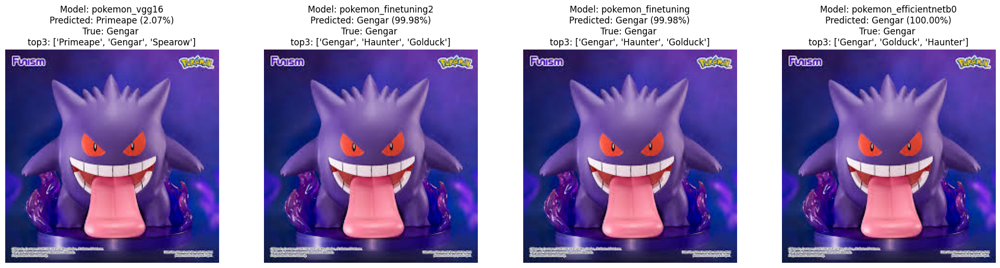

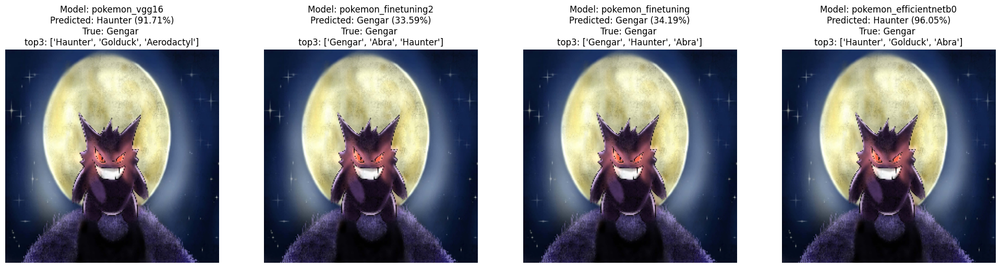

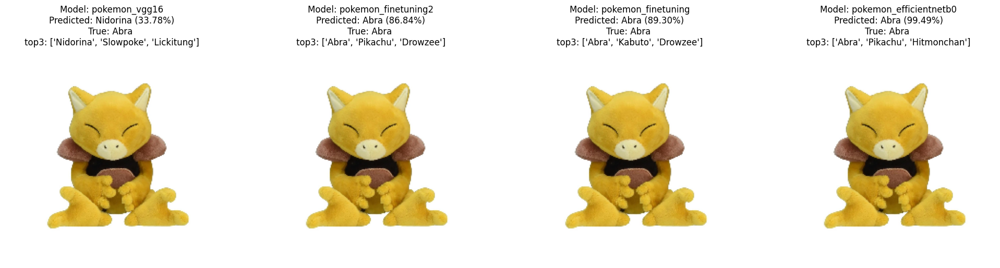

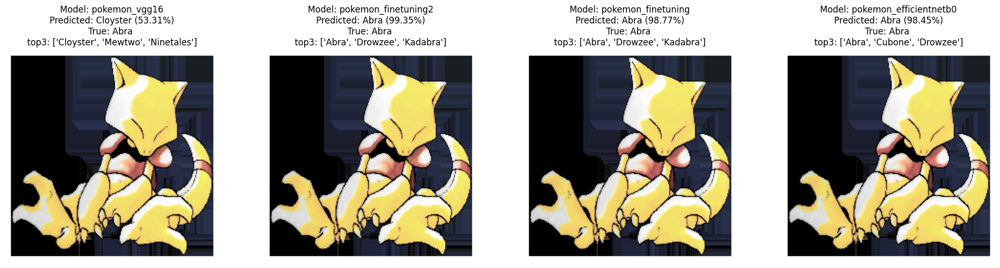

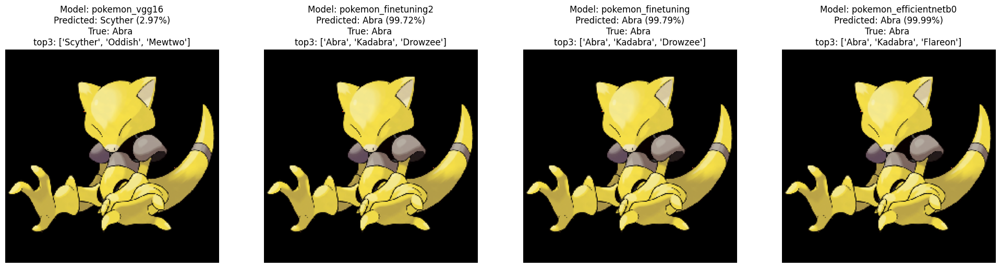

...

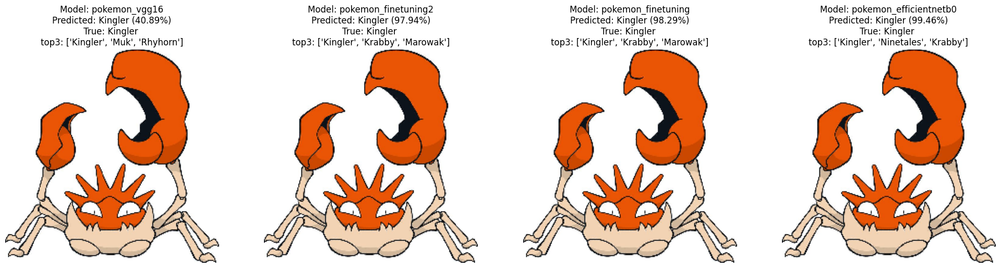

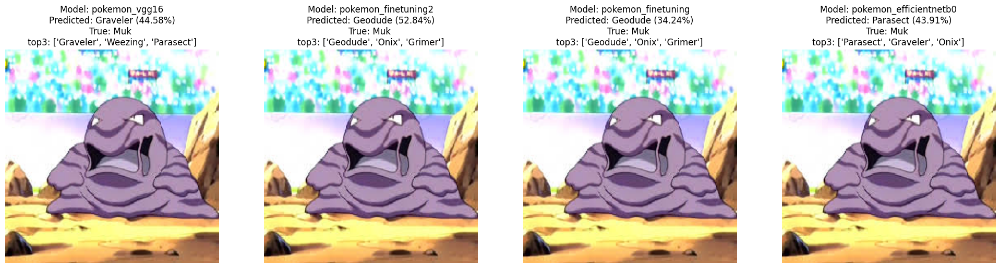

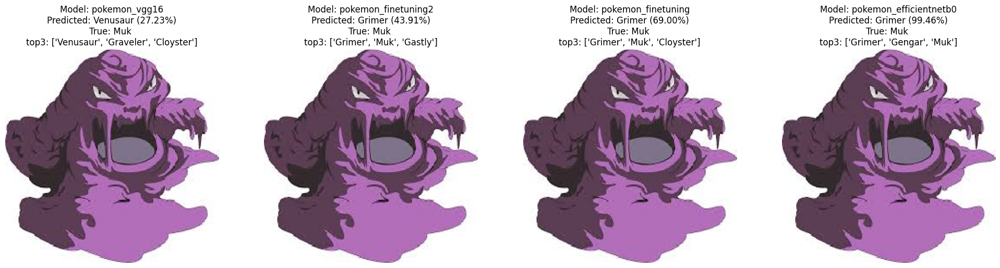

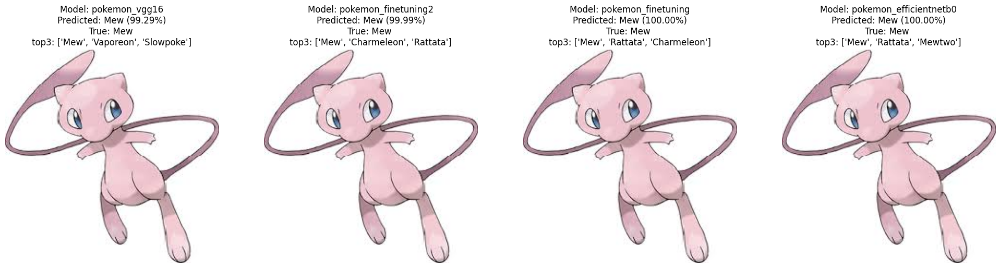

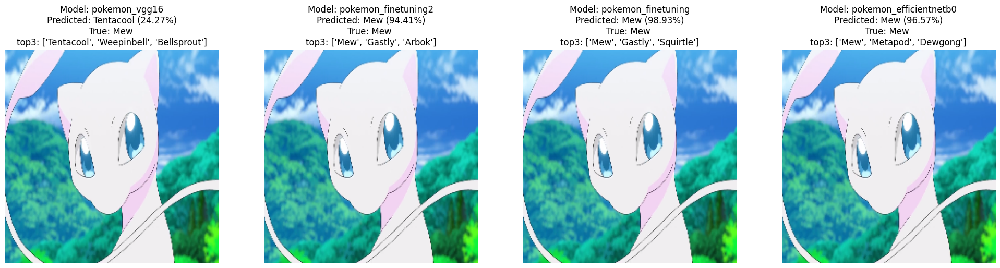

In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.preprocessing.image import load_img, img_to_array
import numpy as np

class_names = train_ds.class_names

def run_all_model_predictions_on_images(images_directory, models_directory, class_names, img_size=(224,224)):

    # Cargar modelos
    loaded_models = {}
    for model_filename in os.listdir(models_directory):
        if model_filename.endswith('.keras'):
            model_path = os.path.join(models_directory, model_filename)
            try:
                model_name = os.path.splitext(model_filename)[0]
                loaded_models[model_name] = tf.keras.models.load_model(model_path)
            except Exception as e:
                print(f"Error loading model {model_filename}: {e}")
    if not loaded_models:
        print("No hay modelos")
        return

    for class_folder in os.listdir(images_directory):
        class_folder_path = os.path.join(images_directory, class_folder)
        if os.path.isdir(class_folder_path):
            true_label = class_folder

            # Cargar imagenes
            for image_file in os.listdir(class_folder_path):
                if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                    img_path = os.path.join(class_folder_path, image_file)
                    img = load_img(img_path, target_size=img_size)
                    img_array = img_to_array(img)
                    img_array = np.expand_dims(img_array, axis=0)

                    num_models = len(loaded_models)
                    fig, axes = plt.subplots(1, num_models, figsize=(5 * num_models, 5))

                    if num_models == 1:
                        axes = [axes]

                    # Usar modelos
                    for i, (model_name, current_model) in enumerate(loaded_models.items()):
                        predictions = current_model.predict(img_array, verbose=0)
                        predicted_class_index = np.argmax(predictions[0])
                        predicted_class_name = class_names[predicted_class_index]
                        confidence = 100 * np.max(predictions[0])
                        top_k_indices = np.argsort(predictions[0])[-3:][::-1]
                        top_k_classes = [class_names[i] for i in top_k_indices]

                        ax = axes[i]
                        ax.imshow(img)
                        ax.axis("off")
                        ax.set_title(f"Model: {model_name}\nPredicted: {predicted_class_name} ({confidence:.2f}%)\nTrue: {true_label} \ntop3: {top_k_classes}")

                    plt.tight_layout()
                    plt.show()

run_all_model_predictions_on_images(IMAGES_DIRECTORY, './models/', class_names, IMAGE_SIZE)


# Análisis Comparativo de Modelos

Al comparar los modelos entrenados se observa que:

- **VGG16** entrega un rendimiento estable, pero presenta una mayor cantidad de parámetros y mayor tiempo de entrenamiento.
- **EfficientNetB0** logra una mejor precisión con menor complejidad computacional.
- El uso de fine tuning mejora el desempeño final, siempre que se controle adecuadamente la tasa de aprendizaje.

Los resultados obtenidos muestran que el uso de modelos preentrenados permite alcanzar un buen desempeño incluso con conjuntos de datos limitados.

EfficientNetB0 demostró un mejor equilibrio entre precisión y eficiencia frente a VGG16, especialmente tras aplicar fine-tuning.  
Finalmente, el análisis de métricas adicionales permitió una evaluación más completa del comportamiento del modelo, identificando fortalezas y limitaciones.